In [98]:
#Importing required libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import string

#NLP - Natural language processing
import nltk  #natural language tool-kit
from nltk.corpus import stopwords
nltk.download('stopwords')

#Importing required modules from sklearn
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import MultinomialNB
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics import ConfusionMatrixDisplay, classification_report, accuracy_score

#Importing harmless warnings
import warnings
warnings.filterwarnings('ignore')

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\Sanjoy\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [99]:
#Data Sample
data = pd.read_csv('spam_Emails_data.csv')
data.head()

,label,text
0,Spam,viiiiiiagraaaa\nonly for the ones that want to...
1,Ham,got ice thought look az original message ice o...
2,Spam,yo ur wom an ne eds an escapenumber in ch ma n...
3,Spam,start increasing your odds of success & live s...
4,Ham,author jra date escapenumber escapenumber esca...


In [100]:
#Data Volume
data.shape

(193852, 2)

In [101]:
#Missing Values check
pd.DataFrame({'Missing Values' : round(data.isnull().mean()*100, 5), 'Data Types' : data.dtypes})

,Missing Values,Data Types
label,0.00000,object
text,0.00103,object


In [102]:
# Display rows that contain at least one null value
data[data.isnull().any(axis=1)]

,label,text
47294,Spam,NaN
149214,Ham,NaN


In [103]:
#Dropping missing values
data.drop([47294, 149214], axis = 0, inplace = True)

In [104]:
#Missing Values check
pd.DataFrame({'Missing Values' : round(data.isnull().mean()*100, 5), 'Data Types' : data.dtypes})

,Missing Values,Data Types
label,0.0,object
text,0.0,object


In [105]:
#Analysing Target Column
round(data['label'].value_counts(normalize=True)*100,2)

label
Ham     52.7
Spam    47.3
Name: proportion, dtype: float64

In [106]:
#Analyse the target column based on the input
data.groupby('label').describe()

text                                                                
        count  unique                                                top freq
label                                                                        
Ham    102159  102159  got ice thought look az original message ice o...    1
Spam    91691   91691  viiiiiiagraaaa\nonly for the ones that want to...    1

In [107]:
# length column to understand the independent column
# First check for NaN values and convert them to empty strings before applying len()
data['text_length'] = data['text'].fillna('').apply(len)
data.head()

,label,text,text_length
0,Spam,viiiiiiagraaaa\nonly for the ones that want to...,403
1,Ham,got ice thought look az original message ice o...,530
2,Spam,yo ur wom an ne eds an escapenumber in ch ma n...,215
3,Spam,start increasing your odds of success & live s...,345
4,Ham,author jra date escapenumber escapenumber esca...,3097


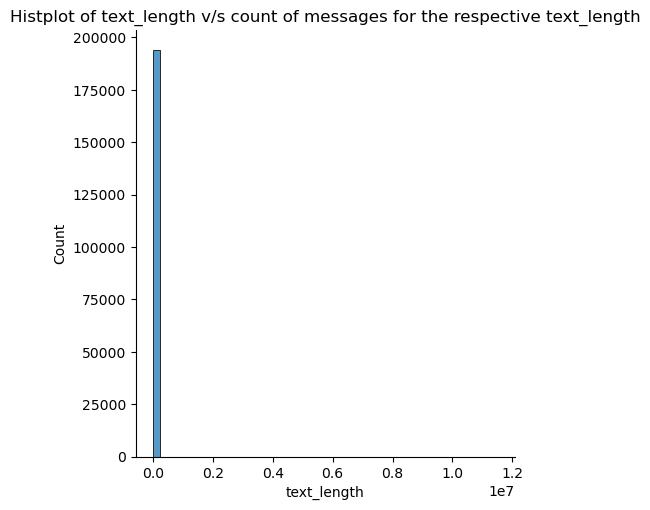

In [108]:
#Understanding the distribution of the text column
sns.displot(x = data['text_length'], bins = 50,  kind = 'hist')
plt.title('Histplot of text_length v/s count of messages for the respective text_length')
plt.show()

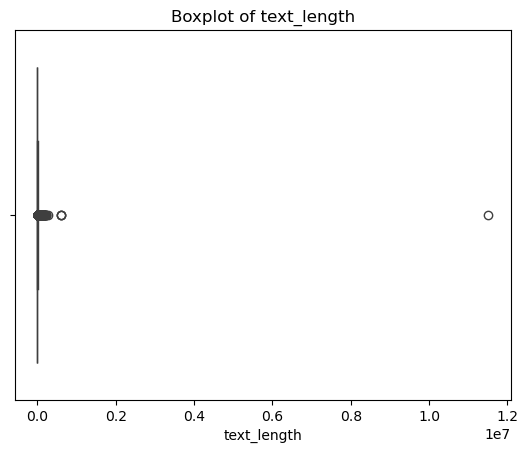

In [109]:
#Box plot for distribution of the text message
sns.boxplot(data['text_length'], orient = 'h')
plt.title('Boxplot of text_length')
plt.show()

In [110]:
#Statistical summary
data['text_length'].describe()

count    1.938500e+05
mean     1.812779e+03
std      2.659510e+04
min      1.000000e+00
25%      3.620000e+02
50%      8.000000e+02
75%      1.803000e+03
max      1.151031e+07
Name: text_length, dtype: float64

In [111]:
#Printing the shortest message and the count
data[data['text_length'] == data['text_length'].min()]['text'].value_counts()

text
p    1
v    1
l    1
)    1
>    1
a    1
b    1
q    1
Name: count, dtype: int64

In [112]:
#Print the longest message
data[data['text_length'] == data['text_length'].max()]['text'].iloc[0]

'bodylabel 0subject great parttime summer job display boxes credit applications need place small owneroperated stores area 1 introduce store owner manager 2 use 90 effective script tells little display box save customers hundreds dollars drawing card business make 5 00 15 00 every app sent 3 find good spot counter place box say nothing need done need name address company send commission checks compensaation 10 every box place becoming representative could also earn commission 10 application came store course much profitable plan pay months years small effort call 1888 7035390 code 3 24 hours receive details removed mailing list type b2998 hotmail com area remove subject area new e mail send 1 1subject auto insurance rates high dear nlpeople sure agree auto insurance costs much even good driving record routine rate increases drive costs roof discovered way many people sign excellent company gives amazingly low rates half rates found shopping around insurance southern california people e

In [113]:
#Remove stopwords, punctuations

#List of stopwords
print(stopwords.words('english'))

#List of punctuations
print(string.punctuation)

['a', 'about', 'above', 'after', 'again', 'against', 'ain', 'all', 'am', 'an', 'and', 'any', 'are', 'aren', "aren't", 'as', 'at', 'be', 'because', 'been', 'before', 'being', 'below', 'between', 'both', 'but', 'by', 'can', 'couldn', "couldn't", 'd', 'did', 'didn', "didn't", 'do', 'does', 'doesn', "doesn't", 'doing', 'don', "don't", 'down', 'during', 'each', 'few', 'for', 'from', 'further', 'had', 'hadn', "hadn't", 'has', 'hasn', "hasn't", 'have', 'haven', "haven't", 'having', 'he', "he'd", "he'll", 'her', 'here', 'hers', 'herself', "he's", 'him', 'himself', 'his', 'how', 'i', "i'd", 'if', "i'll", "i'm", 'in', 'into', 'is', 'isn', "isn't", 'it', "it'd", "it'll", "it's", 'its', 'itself', "i've", 'just', 'll', 'm', 'ma', 'me', 'mightn', "mightn't", 'more', 'most', 'mustn', "mustn't", 'my', 'myself', 'needn', "needn't", 'no', 'nor', 'not', 'now', 'o', 'of', 'off', 'on', 'once', 'only', 'or', 'other', 'our', 'ours', 'ourselves', 'out', 'over', 'own', 're', 's', 'same', 'shan', "shan't", 'she

In [114]:
#Encoding the target label
data['label'] = data['label'].map({'Ham': 0, 'Spam': 1})
data.head()

,label,text,text_length
0,1,viiiiiiagraaaa\nonly for the ones that want to...,403
1,0,got ice thought look az original message ice o...,530
2,1,yo ur wom an ne eds an escapenumber in ch ma n...,215
3,1,start increasing your odds of success & live s...,345
4,0,author jra date escapenumber escapenumber esca...,3097


In [115]:
# Train test split
x_train, x_test, y_train, y_test = train_test_split(data['text'], data['label'], test_size=0.2, random_state=42)

# Vectorizer
vectorizer = TfidfVectorizer(stop_words='english')
x_train_tfidf = vectorizer.fit_transform(x_train)
x_test_tfidf = vectorizer.transform(x_test)

# Naive Bayes Model
model = MultinomialNB()
model.fit(x_train_tfidf, y_train)
print('Training Score:', round(model.score(x_train_tfidf, y_train)*100, 2), '%')

Training Score: 97.23 %
Training Score: 97.23 %



Classification Report:

               precision    recall  f1-score   support

           0       0.94      0.99      0.97     20317
           1       0.99      0.94      0.96     18453

    accuracy                           0.96     38770
   macro avg       0.97      0.96      0.96     38770
weighted avg       0.96      0.96      0.96     38770



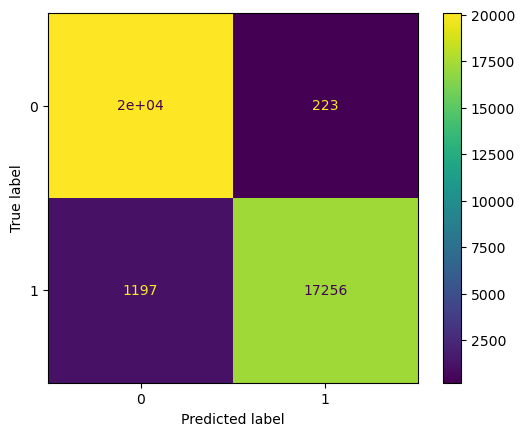

In [116]:
#Model testing
y_pred = model.predict(x_test_tfidf)
cm = ConfusionMatrixDisplay.from_predictions(y_test, y_pred)
report = classification_report(y_test, y_pred)
print('\nClassification Report:\n\n', report)

In [117]:
#Testing score
print(f'Testing Score: {round(accuracy_score(y_test, y_pred)*100, 2)} %')

Testing Score: 96.34 %


In [119]:
#Function to predict a incoming message
message = str(input('Enter your message:'))
input_tfidf= vectorizer.transform([message])
prediction = model.predict(input_tfidf)
if prediction[0] == 1:
    print('The message is Spam.')
else:
    print('The message is Ham.')

Enter your message: Share your card details to win a brand new iphone.


The message is Spam.
